### Import Libraries

In [2]:
import torchvision.transforms as T
from PIL import Image
from matplotlib import pyplot as plt
from matplotlib import pyplot
import numpy as np
import os
import torch
from torchvision import datasets, models
from torch.utils.data import Dataset, DataLoader
from IPython.display import clear_output

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision

import cv2
import random
import math
import copy

In [3]:
#Set device to GPU_indx if GPU is avaliable
GPU_indx = 0
device = torch.device(GPU_indx if torch.cuda.is_available() else 'cpu')
print(device)

cpu


In [4]:
save_checkpoint = True
start_from_checkpoint = False
save_dir = 'Models'
model_name = 'Res_50_Pipes'

#Create Save Path from save_dir and model_name, we will save and load our checkpoint here
save_path = os.path.join(save_dir, model_name + ".pt")

#Create the save directory if it does note exist
if not os.path.isdir(save_dir):
    os.makedirs(save_dir)

#Load Checkpoint
if start_from_checkpoint:
    #Check if checkpoint exists
    if os.path.isfile(save_path):
        #load Checkpoint
        check_point = torch.load(save_path)
        #Checkpoint is saved as a python dictionary
        #https://www.w3schools.com/python/python_dictionaries.asp
        #here we unpack the dictionary to get our previous training states
        model.load_state_dict(check_point['model_state_dict'])
        optimizer.load_state_dict(check_point['optimizer_state_dict'])
        start_epoch = check_point['epoch']
        best_valid_acc = check_point['valid_acc']
        print("Checkpoint loaded, starting from epoch:", start_epoch)
    else:
        #Raise Error if it does not exist
        raise ValueError("Checkpoint Does not exist")
else:
    #If checkpoint does exist and Start_From_Checkpoint = False
    #Raise an error to prevent accidental overwriting
    if os.path.isfile(save_path):
        #raise ValueError("Warning Checkpoint model already exists, please delete to overwrite")
        print('model already exists')
        os.remove(save_path)
    else:
        print("Starting from scratch")

model already exists


In [5]:
class CustomDataSet(Dataset):
    def __init__(self,trn_val_tst = 0, transform=None):
        data = np.load('Models/pipe_data.npz')
        if trn_val_tst == 0:
            #trainloader
            self.images = data['train_imgs']
            self.labels = data['train_labels']
        elif trn_val_tst == 1:
            #valloader
            self.images = data['valid_imgs']
            self.labels = data['valid_labels']
        else:
            #testloader
            self.images = data['test_imgs']
            self.labels = data['test_labels']
            
        self.images = np.float32(self.images)/1.0
        self.transform = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
   
        sample = self.images[idx,:]
        labels = self.labels[idx]
        if self.transform:
            sample = self.transform(sample)
        return sample, labels

In [6]:
# image augmentation
transforms = T.Compose([
    T.ToTensor(),
        T.RandomApply(torch.nn.ModuleList([
            T.ColorJitter(brightness=0,contrast=0.5,saturation=0.5,hue=0.4),
            T.RandomHorizontalFlip(p=0.5), #random Horizontal flip with 50% chance
            T.RandomRotation(90, fill=0),
            T.RandomVerticalFlip(p=0.5),
            T.RandomAffine(degrees = (0,0), translate = (0.3,0.3)), 
        ]), p=0.65)
    ])

In [7]:
def train(model, device, loader, optimizer, loss_fun, loss_logger):
    
    #Set Network in train mode
    model.train()
    
    count = 0
    total_loss = 0
    
    for i, (x, y) in enumerate(loader):
        #Perform a single epoch of training on the input dataloader, logging the loss at every step 
        #Forward pass of image through network and get output
        fx = model(x.to(device))
        y = y.type(torch.LongTensor)

        #Calculate loss using loss function
        loss = loss_fun(fx, y.to(device))
        total_loss += loss.item()
        count += 1
        
        #Zero Gradents
        optimizer.zero_grad()
        #Backpropagate Gradents
        loss.backward()
        #Do a single optimization step
        optimizer.step()

    #log the loss PER EPOCH for plotting
    loss_logger.append(total_loss/count)
   
    #return the logger array       
    return loss_logger

def evaluate(model, device, loader, loss_fun):
    
    #initialise counter
    epoch_acc = 0
    count = 0
    total_loss = 0
    
    #Set network in evaluation mode
    #Layers like Dropout will be disabled
    #Layers like Batchnorm will stop calculating running mean and standard deviation
    #and use current stored values
    #(More on these layer types soon!)
    model.eval()
    
    with torch.no_grad():
        for i, (x, y) in enumerate(loader):
            #Forward pass of image through network
            fx = model(x.to(device))
            y = y.type(torch.LongTensor)
            
            #log the cumulative sum of the acc
            epoch_acc += (fx.argmax(1) == y.to(device)).sum().item()
            
            #calculate the loss
            loss = loss_fun(fx, y.to(device))
            total_loss += loss.item()
            count += 1
    
    # Calculating the average loss per epoch
    loss_per_epoch = total_loss/count
    #return the accuracy from the epoch     
    return epoch_acc*100 / len(loader.dataset), loss_per_epoch

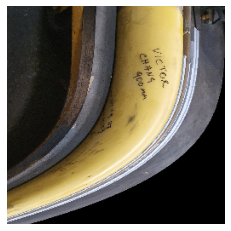

1


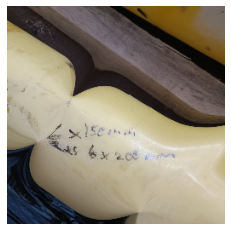

1


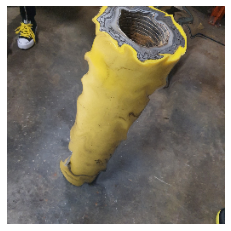

1


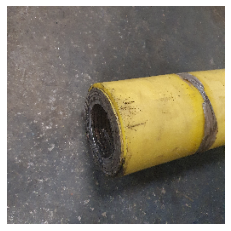

0


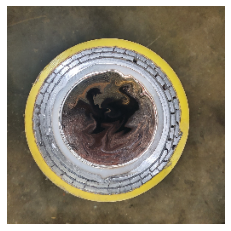

2


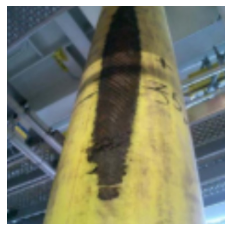

1


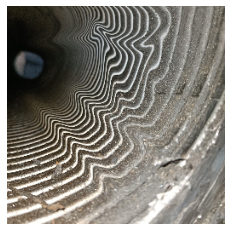

2


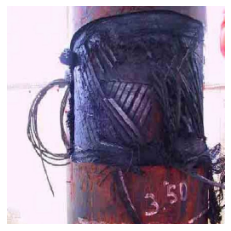

1


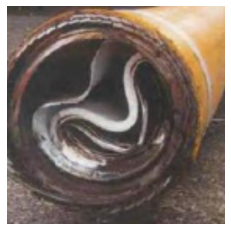

2


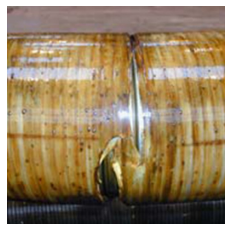

1


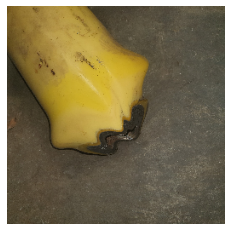

1


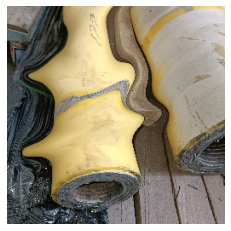

1


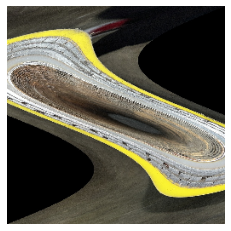

2


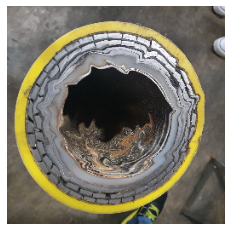

2


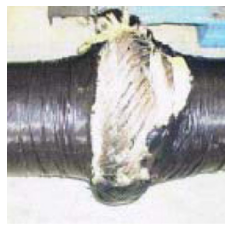

1


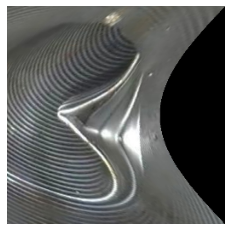

2


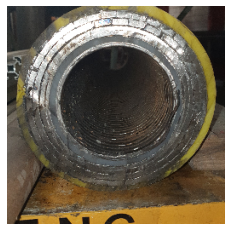

0


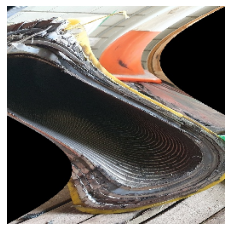

2


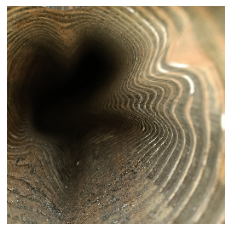

2


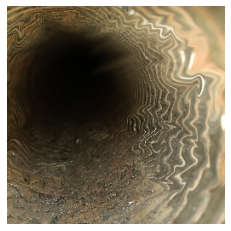

2


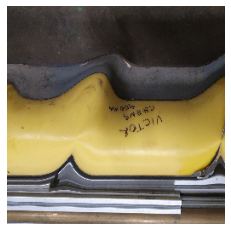

1


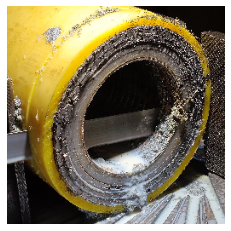

0


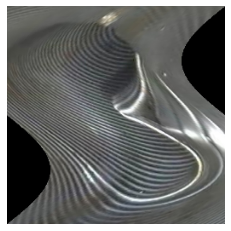

2


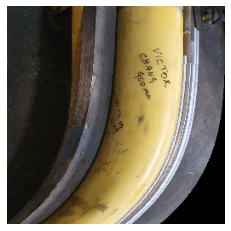

1


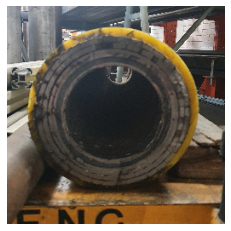

0


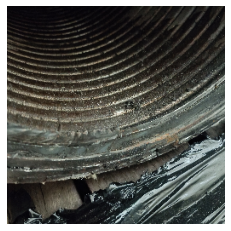

0


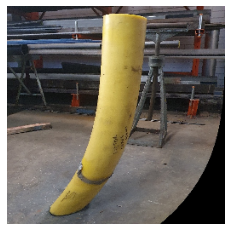

1


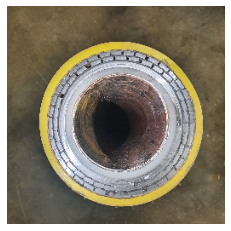

0


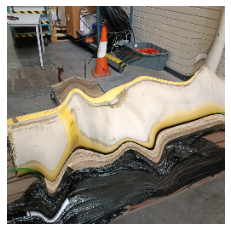

1


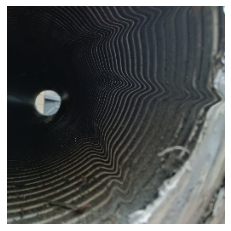

2


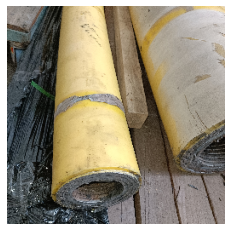

0


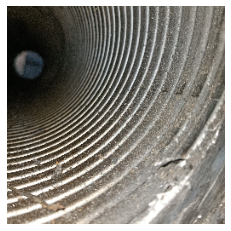

0


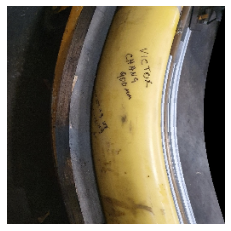

1


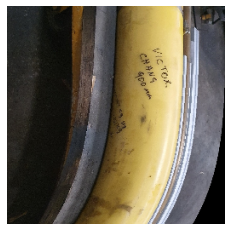

1


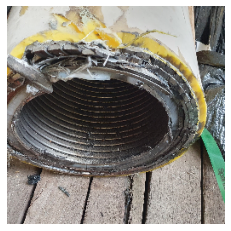

0


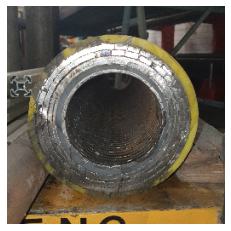

0


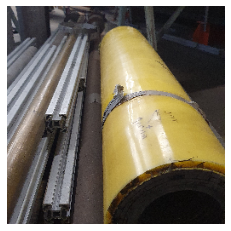

0


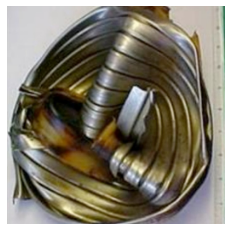

2


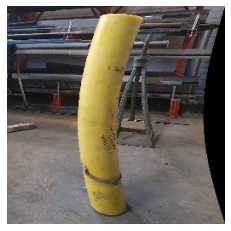

1


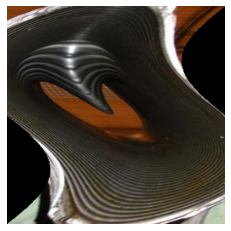

2


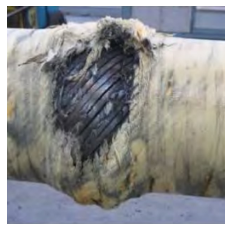

1


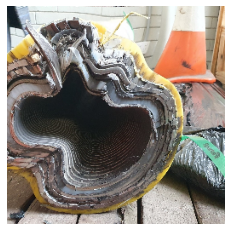

2


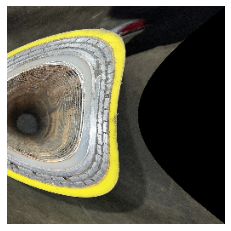

2


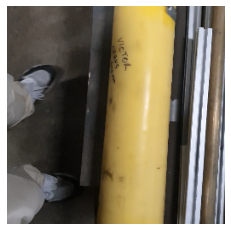

0


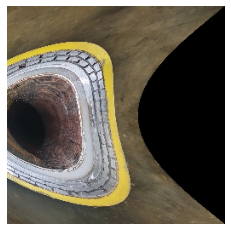

2


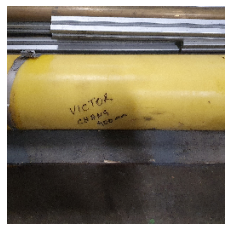

0


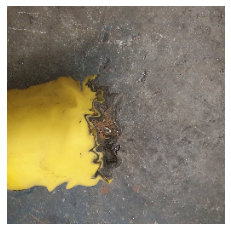

1


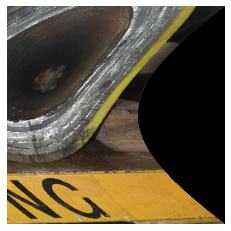

2


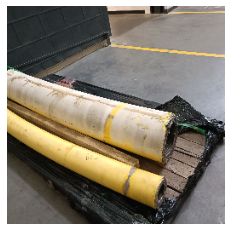

0


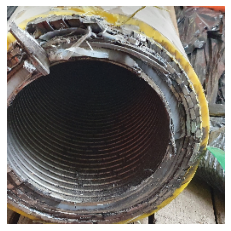

0


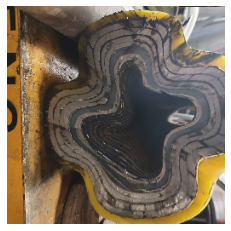

2


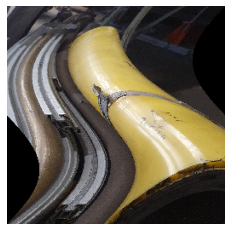

1


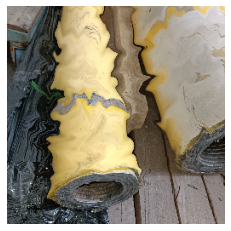

1


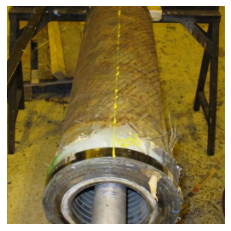

1


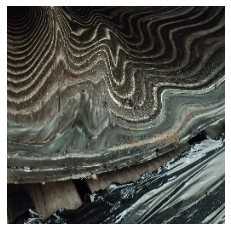

2


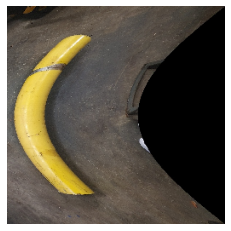

1


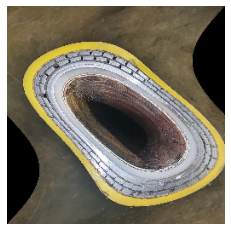

2


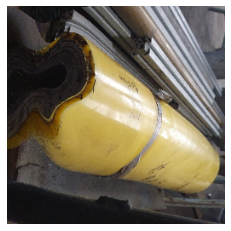

1


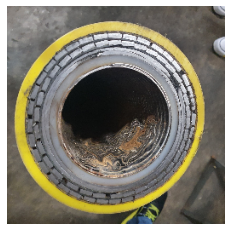

2


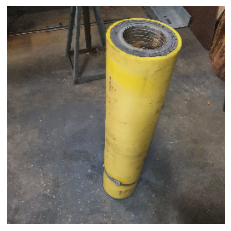

0


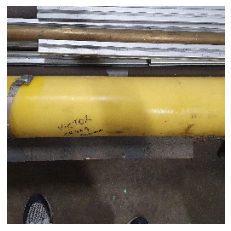

0


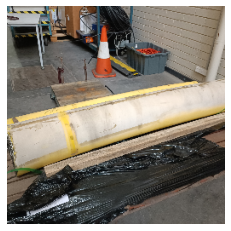

0


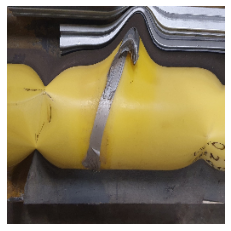

1


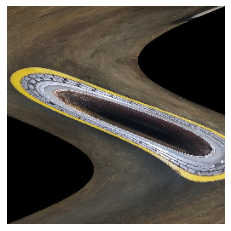

2


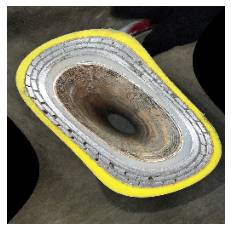

2


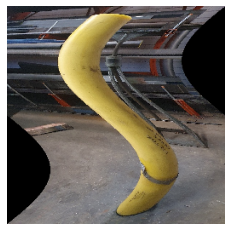

1


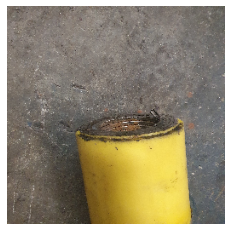

0


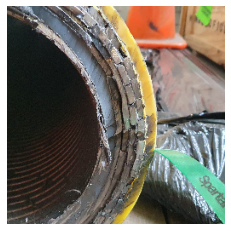

0


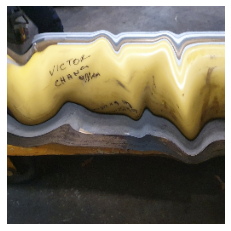

1


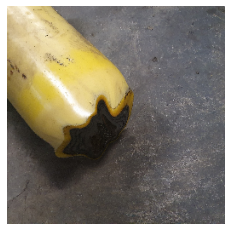

1


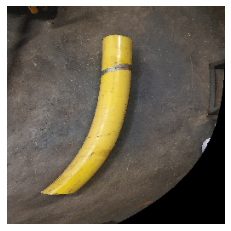

1


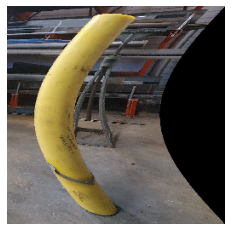

1


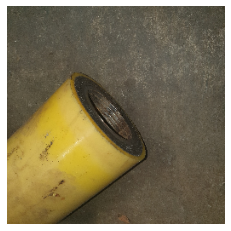

0


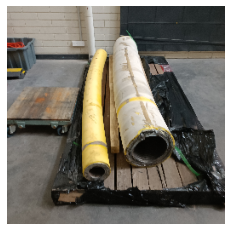

0


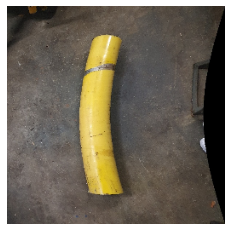

1


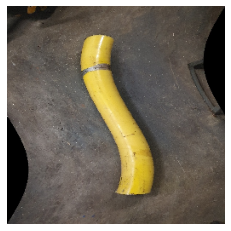

1


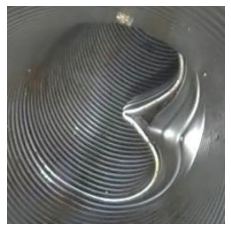

2


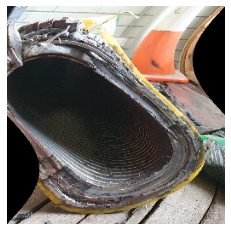

2


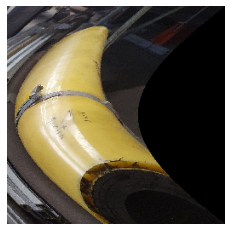

1


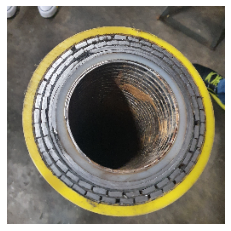

0


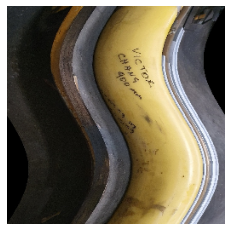

1


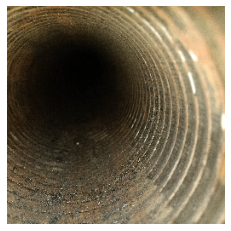

0


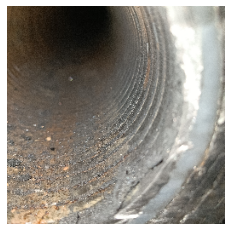

0


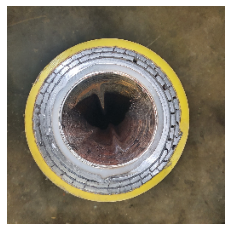

2


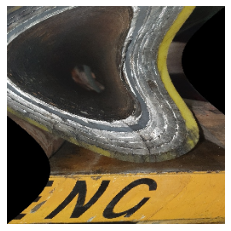

2


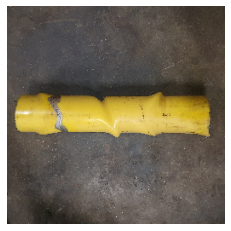

1


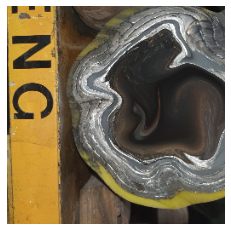

2


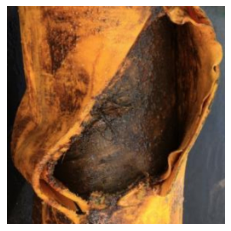

1


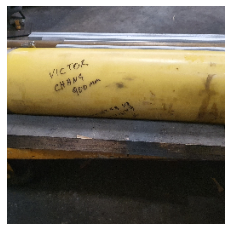

0


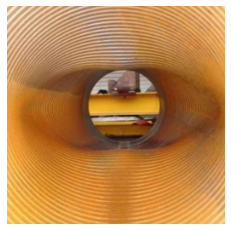

2


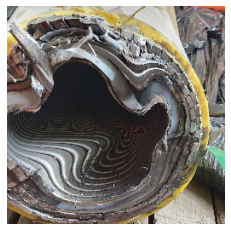

2


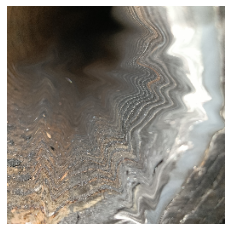

2


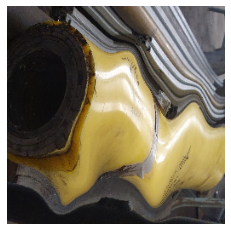

1


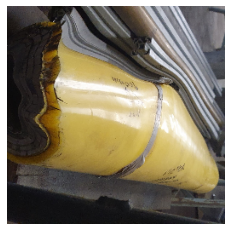

1


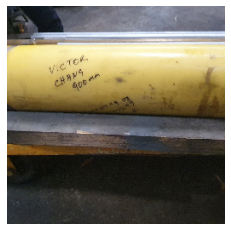

0


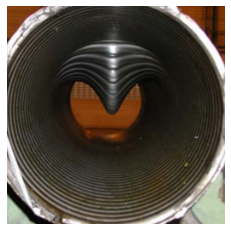

2


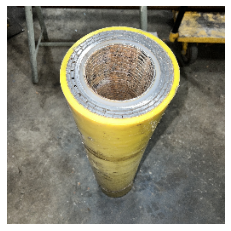

0


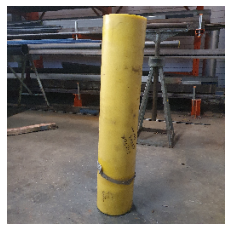

0


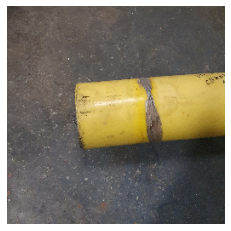

0


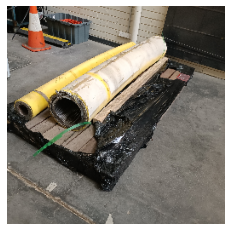

0


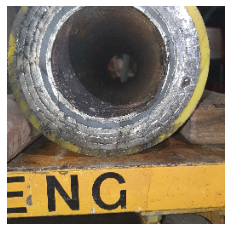

0


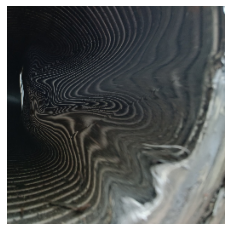

2


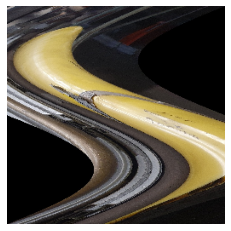

1


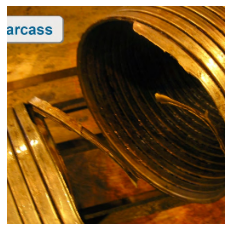

1


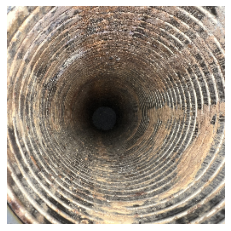

0


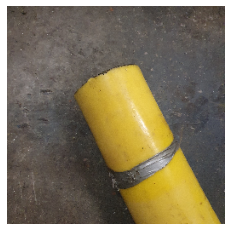

0


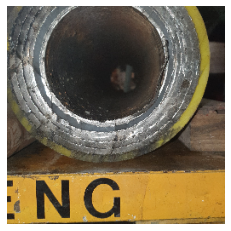

0


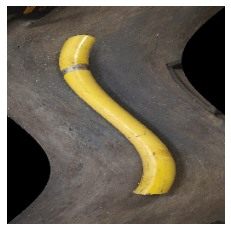

1


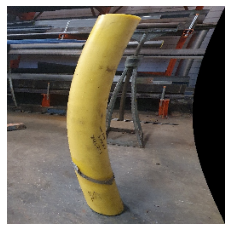

1


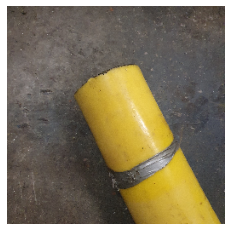

0


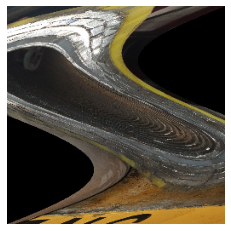

2


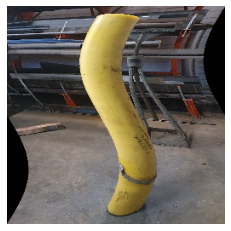

1


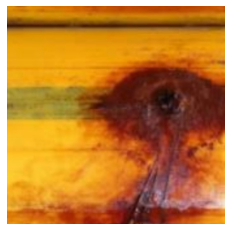

1


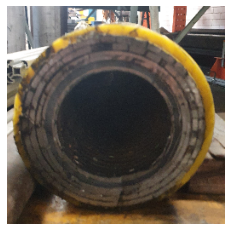

0


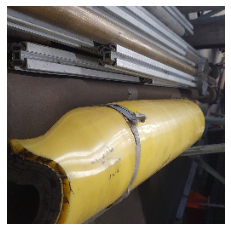

1


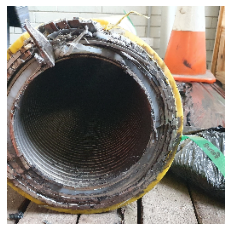

0


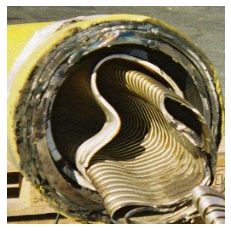

2


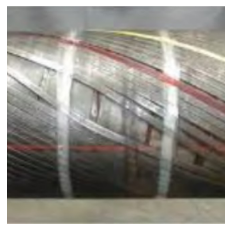

1


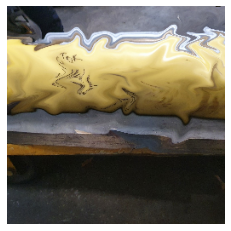

1


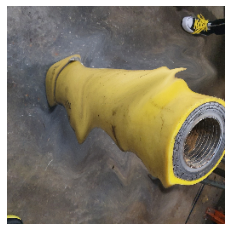

1


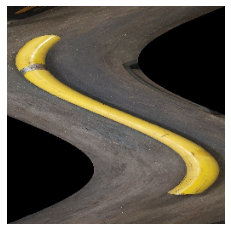

1


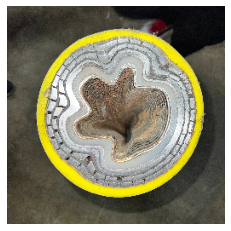

2


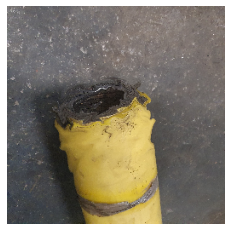

1


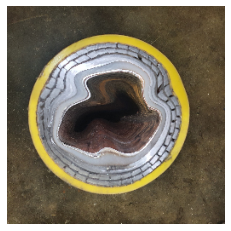

2


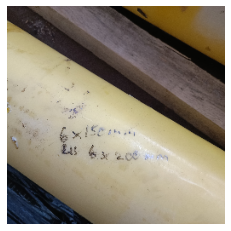

0


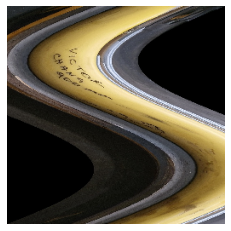

1


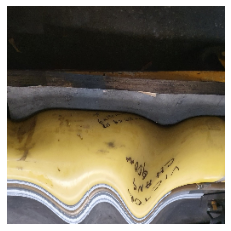

1


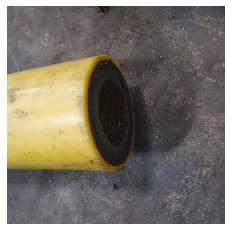

0


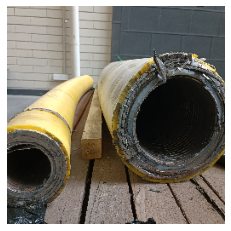

0


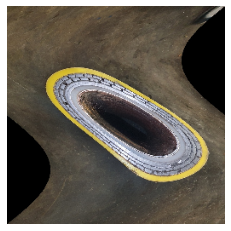

2


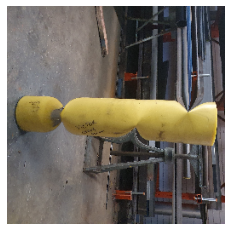

1


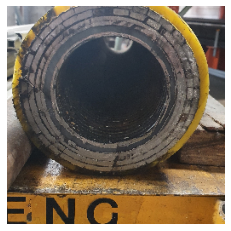

0


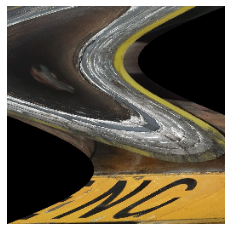

2


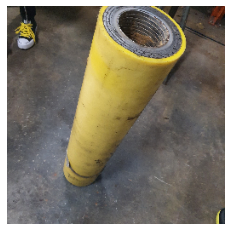

0


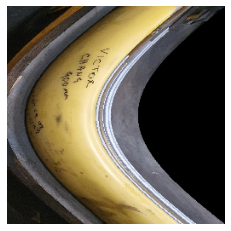

1


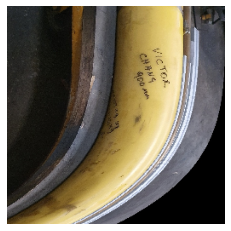

1


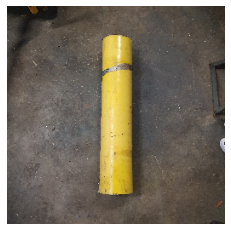

0


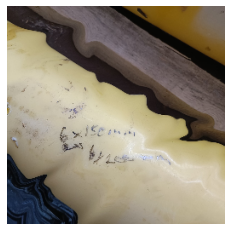

1


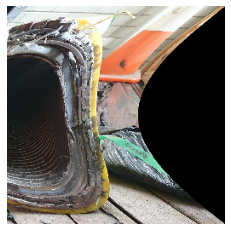

2


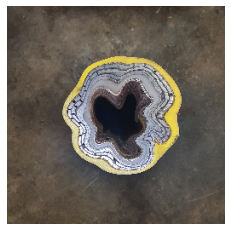

2


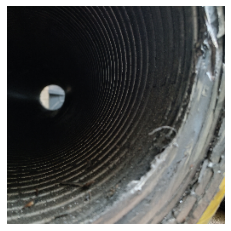

0


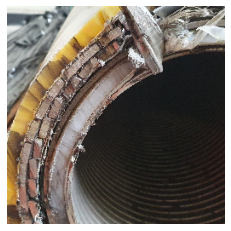

0


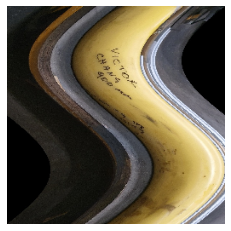

1


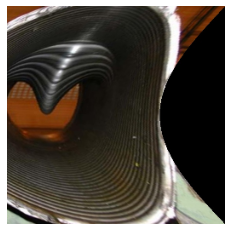

2


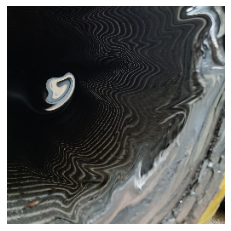

2


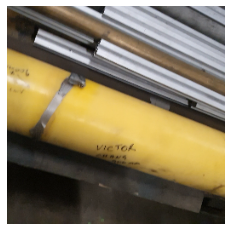

0


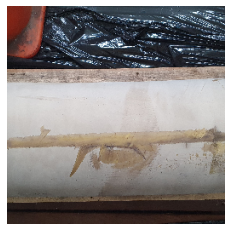

0


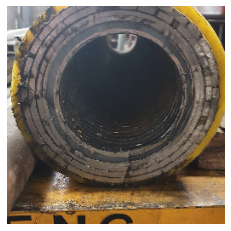

0


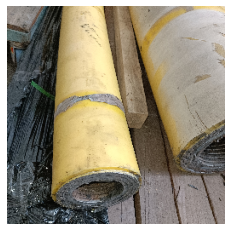

0


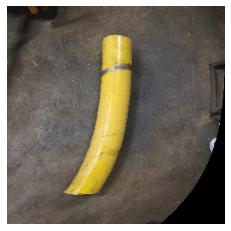

1


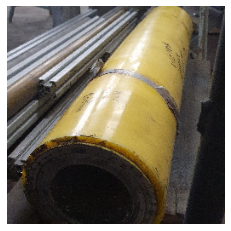

0


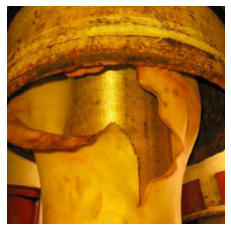

1


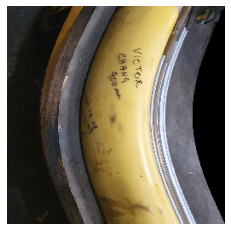

1


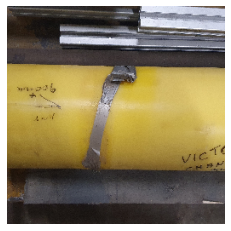

0


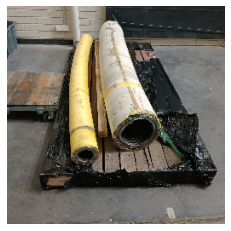

0


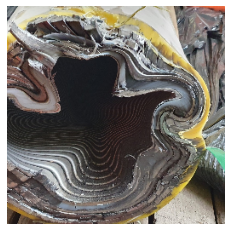

2


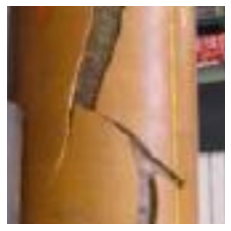

1


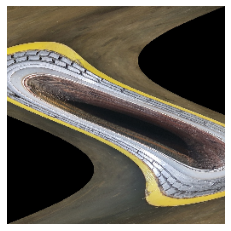

2


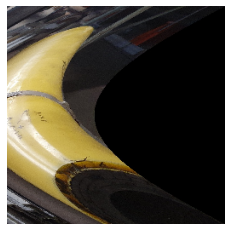

1


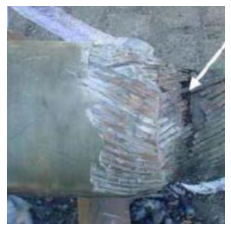

1


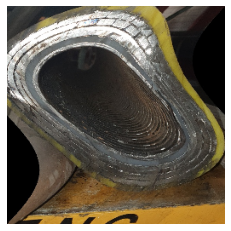

2


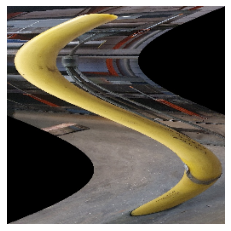

1


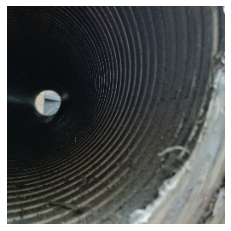

0


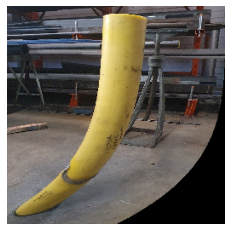

1


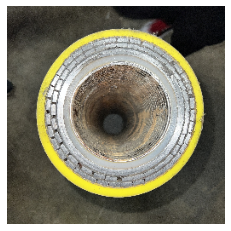

0


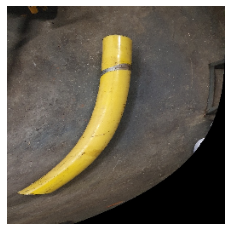

1


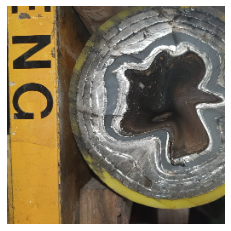

2


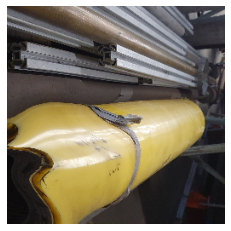

1


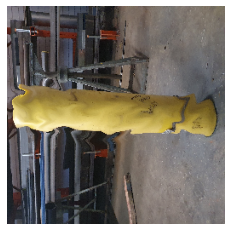

1


In [8]:
train_imgs = []
train_labels = []

filepath_undamage = 'pipe_images'
filepath_external_damage = 'external_damage'
filepath_internal_damage = 'internal_damage'
no_transforms = T.Compose([T.ToTensor()])

def resize_and_label(filepath,train_imgs,train_labels):
    for img in os.listdir(filepath):
        if img.endswith('.jpg') or img.endswith('.png'):
            # Read image
            img = cv2.imread(filepath + '/' + img)
            
            # Crop image to square
            crop_size = min(img.shape[0], img.shape[1])
            start_row = (img.shape[0]-crop_size)//2
            end_row = (img.shape[0]-crop_size)//2 + crop_size
            start_col = (img.shape[1]-crop_size)//2
            end_col = (img.shape[1]-crop_size)//2 + crop_size
            img = img[start_row:end_row, start_col:end_col]
            
            # Rescale image
            img = cv2.resize(img, (256,256), interpolation=cv2.INTER_CUBIC)
            img = no_transforms(np.array(img))
            img = np.moveaxis(img.numpy(), 0, 2)
            train_imgs.append(img)
            if filepath == filepath_undamage: 
                train_labels.append(0)
            elif filepath == filepath_external_damage:
                train_labels.append(1)
            else:
                train_labels.append(2)

    return train_imgs, train_labels

train_imgs, train_labels = resize_and_label(filepath_undamage,train_imgs,train_labels)
train_imgs, train_labels = resize_and_label(filepath_external_damage,train_imgs,train_labels)
train_imgs, train_labels = resize_and_label(filepath_internal_damage,train_imgs,train_labels)

# set seed and shuffle for images and labels
random.seed(12)
random.shuffle(train_imgs)
random.seed(12) 
random.shuffle(train_labels)

for i in range(len(train_imgs)):
    img = train_imgs[i]
    pyplot.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    pyplot.axis("off")
    pyplot.show()
    print(train_labels[i])

In [9]:
training_loss_logger = []
# validation_loss_logger = []

training_acc_logger = []
# validation_acc_logger = []
testing_acc_logger = []
testing_loss_logger = []

learning_rate =7e-6
batch_size = 20
highest_test_acc = -math.inf
valid_acc = 0   # Just setting a random acc to store in model, since we do not have validation images yet

for time in range(5):
    n = len(train_imgs)
    # valid_imgs = train_imgs[math.floor(0.85*n):n]
    # valid_labels = train_labels[math.floor(0.85*n):n]
    valid_imgs = []
    valid_labels = []
    test_imgs = train_imgs[math.floor(0.7*n):n]
    test_labels = train_labels[math.floor(0.7*n):n]
    train_imgs = train_imgs[0:math.ceil(0.7*n)]
    train_labels = train_labels[0:math.ceil(0.7*n)]

    np.savez("Models/pipe_data", train_imgs=train_imgs, train_labels=train_labels, valid_imgs=valid_imgs, valid_labels=valid_labels, test_imgs=test_imgs, test_labels=test_labels)

    train_set = CustomDataSet(trn_val_tst=0, transform=transforms)
    # valid_set = CustomDataSet(trn_val_tst=1, transform=torchvision.transforms.ToTensor())
    test_set = CustomDataSet(trn_val_tst=2, transform=torchvision.transforms.ToTensor())

    trainloader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
    # validloader = DataLoader(valid_set, batch_size=batch_size, shuffle=True)
    testloader = DataLoader(test_set, batch_size=batch_size, shuffle=True)

    model = models.resnet50(pretrained=True)

    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, 3)
    model = model.to(device)
    # print(model.parameters)

    start_epoch = 0
    num_epochs = 50

    optimizer = optim.Adam(model.parameters(), lr = learning_rate, weight_decay = 5e-6)
    loss_fun = nn.CrossEntropyLoss()

    #This cell implements our training loop
    for epoch in range(start_epoch, num_epochs):
        
        #call the training function and pass training dataloader etc
        training_loss_logger = train(model, device, trainloader, optimizer, loss_fun, training_loss_logger)
        
        #call the evaluate function and pass the dataloader for both ailidation and training
        train_acc, _ = evaluate(model, device, trainloader, loss_fun)
        training_acc_logger.append(train_acc)
        
    #     valid_acc, valid_loss = evaluate(model, device, validloader, loss_fun)
    #     validation_loss_logger.append(valid_loss)
    #     validation_acc_logger.append(valid_acc)
    
        test_acc, test_loss = evaluate(model, device, testloader, loss_fun)
        testing_loss_logger.append(test_loss)
        testing_acc_logger.append(test_acc)

        #If this model has the highest performace on the validation set 
        #then save a checkpoint
        #{} define a dictionary, each entry of the dictionary is indexed with a string
        if (test_acc > highest_test_acc):
            highest_test_acc = test_acc
            highest_test_acc_epoch = epoch
            if save_checkpoint:
                print("Saving Model")
                torch.save({
                    'epoch':                 epoch,
                    'model_state_dict':      model.state_dict(),
                    'optimizer_state_dict':  optimizer.state_dict(), 
                    'train_acc':             train_acc,
                    'valid_acc':             valid_acc,
                }, save_path)
        
        clear_output(True)
        print(f'| Epoch: {epoch+1:02} | Train Acc: {train_acc:05.2f}% | Val. Acc: {valid_acc:05.2f}% | Test Acc: {test_acc:05.2f}%')
        # print(f'| Epoch: {epoch+1:02} | Train Acc: {train_acc:05.2f}%')
    print("Training Complete")

| Epoch: 50 | Train Acc: 100.00% | Val. Acc: 00.00% | Test Acc: 69.23%
Training Complete


In [10]:
output_train=[training_acc_logger[i:i + num_epochs] for i in range(0, len(training_acc_logger), num_epochs)]
output_test = [testing_acc_logger[i:i + num_epochs] for i in range(0, len(testing_acc_logger), num_epochs)]
output_train_loss = [training_loss_logger[i:i + num_epochs] for i in range(0, len(training_loss_logger), num_epochs)]
output_test_loss = [testing_loss_logger[i:i + num_epochs] for i in range(0, len(testing_loss_logger), num_epochs)]


In [11]:
def cal_ave(output,num_epochs,ls):
    for j in range(num_epochs):
        sum = 0
        for i in range(len(output)):
            sum += output[i][j]
            ave = sum/5
        ls.append(ave)
    return ls
ave_train_acc = []
ave_test_acc = []
ave_train_loss = []
ave_test_loss = []
print(cal_ave(output_train,num_epochs,ave_train_acc))
print(cal_ave(output_test,num_epochs,ave_test_acc))
print(cal_ave(output_train_loss,num_epochs,ave_train_loss))
print(cal_ave(output_test_loss,num_epochs,ave_test_loss))

[28.530408773678964, 32.27270569244648, 37.49399420785264, 39.841333143426866, 47.80225988700565, 54.91155106110241, 58.37667948535346, 68.50030859801548, 77.27645634524995, 76.31847315197265, 81.25722831505485, 85.72791150358448, 85.11432369557993, 88.62702369083226, 86.8146512842425, 87.63267340834639, 90.22081374922851, 91.07529791577649, 91.79528082419408, 89.99686654322747, 90.57674595261834, 90.65517732516736, 94.32469258889998, 91.77567298105683, 94.65237620471918, 93.74476570289133, 95.42838152210037, 94.3555523904477, 95.09770687936192, 93.63300574467075, 97.37530266343825, 94.80914399658168, 97.94108151735271, 98.30247353178558, 98.3024735317856, 97.35009257940465, 95.76736457294783, 98.61059678108532, 97.55732801595215, 95.75060532687652, 97.24920476665243, 96.90196078431373, 99.18482647296207, 98.27161373023787, 96.87936191425723, 98.36965294592412, 98.17072591748564, 98.61059678108532, 99.66101694915254, 99.32488249537103]
[28.205128205128204, 32.22976370035194, 32.5867269

Text(0, 0.5, 'Accuracy')

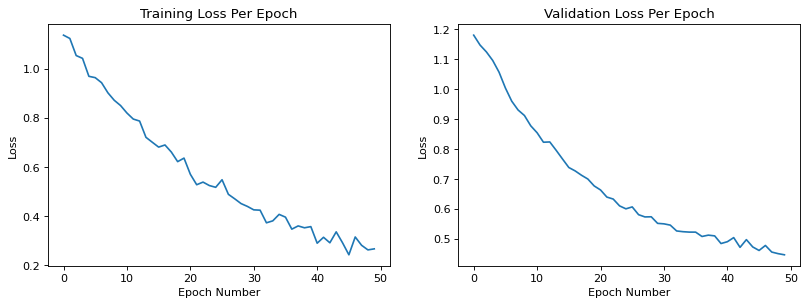

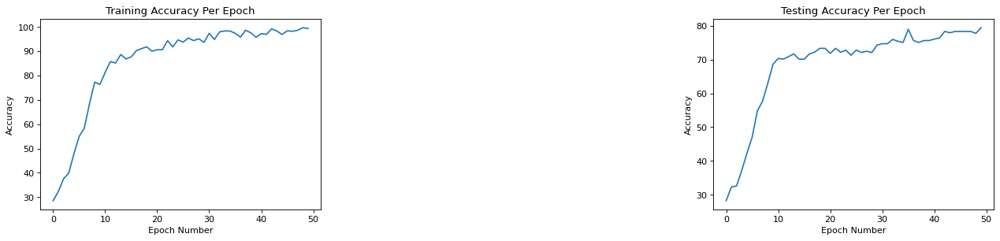

In [12]:
# Plotting the Loss graphs:

# print('The highest validation accuracy is: ', highest_val_acc)

# Training Loss
plt.figure(figsize=(8, 4), dpi=80)
plt.subplots_adjust(right = 1.3)
plt.tight_layout()
plt.subplot(1,2,1)
train_x = np.linspace(0, epoch, len(ave_train_loss))
plt.plot(train_x, ave_train_loss)
plt.title('Training Loss Per Epoch')
plt.xlabel('Epoch Number')
plt.ylabel('Loss')

# # Validation Loss
# plt.subplot(1,2,2)
# valid_x = np.linspace(0, epoch, len(validation_loss_logger))
# plt.plot(valid_x, validation_loss_logger)
# plt.title('Validation Loss Per Epoch')
# plt.xlabel('Epoch Number')
# plt.ylabel('Loss')

# Testing Loss
plt.subplot(1,2,2)
test_x = np.linspace(0, epoch, len(ave_test_acc))
valid_x = np.linspace(0, epoch, len(ave_test_loss))
plt.plot(test_x, ave_test_loss)
plt.title('Validation Loss Per Epoch')
plt.xlabel('Epoch Number')
plt.ylabel('Loss')

# Plotting the Acc graphs
# Training Acc
plt.figure(figsize=(11, 4), dpi=80)
plt.subplots_adjust(right = 1.5)
plt.tight_layout()
plt.subplot(1,3,1)
train_x = np.linspace(0, epoch, len(ave_train_acc))
plt.plot(train_x, ave_train_acc)
plt.title('Training Accuracy Per Epoch')
plt.xlabel('Epoch Number')
plt.ylabel('Accuracy')

# # Validation Acc
# plt.subplot(1,3,2)
# valid_x = np.linspace(0, epoch, len(validation_acc_logger))
# plt.plot(valid_x, validation_acc_logger)
# plt.title('Validation Accuracy Per Epoch')
# plt.xlabel('Epoch Number')
# plt.ylabel('Accuracy')

# Testing Acc
plt.subplot(1,3,3)
test_x = np.linspace(0, epoch, len(ave_test_acc))
plt.plot(test_x, ave_test_acc)
plt.title('Testing Accuracy Per Epoch')
plt.xlabel('Epoch Number')
plt.ylabel('Accuracy')